<a href="https://colab.research.google.com/github/MHathorn/MSc-Dissertation/blob/main/UNet_experiments.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Hide output of this cell and install packages
%%capture
!pip install fastcore fastai --upgrade
!pip3 install SemTorch
!pip install rasterio
!pip install geopandas

# Import packages
from fastai.vision.all import *
import numpy as np
import random
import os
import pytz
from datetime import datetime
from semtorch import get_segmentation_learner
from google.colab import drive
from IPython.display import Audio, display
from sklearn.model_selection import train_test_split

from natsort import os_sorted
from os.path import join, exists
from os import listdir, makedirs, remove, stat
import glob

import rasterio
import rasterio.features
from rasterio.features import rasterize
import rasterio.plot
import sys
import cv2

import shapely.geometry
from shapely.geometry import MultiPolygon, Polygon
from shapely.ops import unary_union
import geopandas as gpd

In [ ]:
# Check, which GPU was allocated
!nvidia-smi

In [ ]:
# Custom loss functions
class CombinedLoss:
    '''Dice and Focal combined'''
    def __init__(self, axis=1, smooth=1., alpha=1.):
        store_attr()
        self.focal_loss = FocalLossFlat(axis=axis)
        self.dice_loss =  DiceLoss(axis, smooth)

    def __call__(self, pred, targ):
        return self.focal_loss(pred, targ) + self.alpha * self.dice_loss(pred, targ)

    def decodes(self, x):    return x.argmax(dim=self.axis)
    def activation(self, x): return F.softmax(x, dim=self.axis)

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Set path of root folder of images and masks
path = Path(f"/content/drive/MyDrive/BEAM/training_imagery")

# Set codes
codes = ['Background', 'Building']


Mounted at /content/drive


In [ ]:
!unzip "{path}/images_masks.zip" -d "/content/ramp"
!unzip "{path}/images_masks_ethekwini.zip" -d "/content/ethekwini"

Streaming output truncated to the last 5000 lines.
 extracting: /content/ramp/content/ramp_images_vm/mask_tiles/ramp_mzuzu_malawi_52e781ee_ae54_42ef_b480_f10a30e06a0f.tif.png  
 extracting: /content/ramp/content/ramp_images_vm/mask_tiles/ramp_mzuzu_malawi_32361416_7f68_4df8_bc06_a7b7e55baa3a.tif.png  
 extracting: /content/ramp/content/ramp_images_vm/mask_tiles/ramp_accra_ghana_8b056640_ecd4_4378_a9b6_3cb0636c3585.tif.png  
  inflating: /content/ramp/content/ramp_images_vm/mask_tiles/ramp_mzuzu_malawi_8841f740_e66e_44b5_a82d_9644006bd3e0.tif.png  
 extracting: /content/ramp/content/ramp_images_vm/mask_tiles/ramp_accra_ghana_3ebb8cd9_a525_4a5c_b091_c75931753f3b.tif.png  
 extracting: /content/ramp/content/ramp_images_vm/mask_tiles/ramp_mzuzu_malawi_6c112000_ee80_4baa_8bd3_3fbcc2db9a02.tif.png  
 extracting: /content/ramp/content/ramp_images_vm/mask_tiles/ramp_mzuzu_malawi_ea6c58d8_7455_424c_bff6_1a820558eb06.tif.png  
 extracting: /content/ramp/content/ramp_images_vm/mask_tiles/ramp_mzu

In [ ]:
path

Path('/content/drive/MyDrive/BEAM/training_imagery')

In [ ]:
source_dir = f'ethekwini/{path}/image_tiles'
dest_dir = 'content/os_images/image_tiles'
if not os.path.exists(dest_dir):
  os.makedirs(dest_dir)
files = os.listdir (source_dir)
for file in files:
    shutil.copy (os.path.join (source_dir, file), dest_dir)

In [ ]:
source_dir = 'ramp/content/ramp_images_vm/image_tiles'
dest_dir = 'content/os_images/image_tiles'
if not os.path.exists(dest_dir):
  os.makedirs(dest_dir)
files = os.listdir (source_dir)
for file in files:
    shutil.copy (os.path.join (source_dir, file), dest_dir)

In [ ]:
source_dir = f'ethekwini/{path}/mask_tiles_erode'
dest_dir = 'content/os_images/mask_tiles_erode'
if not os.path.exists(dest_dir):
  os.makedirs(dest_dir)
files = os.listdir (source_dir)
for file in files:
    shutil.copy (os.path.join (source_dir, file), dest_dir)

In [ ]:
source_dir = f'ramp/content/ramp_images_vm/mask_tiles'
dest_dir = 'content/os_images/mask_tiles_erode'
if not os.path.exists(dest_dir):
  os.makedirs(dest_dir)
files = os.listdir (source_dir)
for file in files:
    shutil.copy (os.path.join (source_dir, file), dest_dir)

In [ ]:
len(get_image_files('content/os_images/mask_tiles_erode'))

6208

In [ ]:
len(get_image_files('content/os_images/image_tiles'))

6208

In [ ]:
def n_codes(fnames, is_partial=True):
  '''Gather the codes from a list of fnames'''
  vals = set()
  if is_partial:
    random.shuffle(fnames)
    fnames = fnames[:10]
  for fname in fnames:
    msk = np.array(PILMask.create(fname))
    for val in np.unique(msk):
      if val not in vals:
        vals.add(val)
  vals = list(vals)
  p2c = dict()
  for i,val in enumerate(vals):
    p2c[i] = vals[i]
  return p2c

def get_msk(fn, p2c):
  '''Grab a mask from a filename and adjust the pixels based on p2c'''
  path = Path(f"content/os_images") if open_source else Path(f"/content/drive/MyDrive/BEAM/training_imagery") # change this to your data
  pix2class = n_codes(lbl_names)
  # old structure: fn = f'{path}/buildings_mask_tiles/2019_10cm_RGB_BE_67/{tile_type}/{fn.stem[:-3]}lbl{fn.suffix}'
  fn = str(fn).replace('image_tiles', 'mask_tiles_erode') if erode else str(fn).replace('image_tiles', 'mask_tiles')
  msk = np.array(PILMask.create(fn))
  mx = np.max(msk)
  for i, val in enumerate(p2c):
    msk[msk==p2c[i]] = val
  return PILMask.create(msk)

def get_y(o):
  return get_msk(o, p2c)

def batch_size(backbone, tile_size):
  '''Automatically set batch size depending on image size and architecture used'''
  if '512' in tile_size:
    batch_size_dict = {'resnet152': 2, 'resnet101': 2, 'resnet50': 2, # Change batch size for used backbone if you run into CUDA out of memory errors
                       'resnet34': 11, 'resnet18': 8, 'vgg16_bn': 2,
                       'hrnet_w18': 32, 'hrnet_w30': 32, 'hrnet_w32': 32,
                       'hrnet_w48': 18}
  elif '256' in tile_size:
    batch_size_dict = {'resnet152': 2, 'resnet101': 2, 'resnet50': 2,
                       'resnet34': 11, 'resnet18': 64}
  return batch_size_dict[backbone]

def create_missing_folder(folder):
  '''Create missing folders'''
  if not os.path.exists(folder):
    os.makedirs(folder)

def timestamp():
  '''Timestamp experiments'''
  tz = pytz.timezone('Europe/London')
  date = str(datetime.now(tz)).split(" ")
  date_time = f"{date[0]}_{date[1].split('.')[0][:5]}"
  return date_time

def get_tile_size(tile_type):
  if '512' in tile_type or '500' in tile_type:
    tile_size = '512'
  elif '256' in tile_type:
    tile_size = '256'
  return tile_size

def check_fnames_lbls(tile_type):
  '''Get images and labels for dataloader and check whether their number is equal'''
  global fnames, lbl_names
  path = Path(f"content/os_images") if open_source else Path(f"/content/drive/MyDrive/BEAM/training_imagery") # change this to your data
  fnames = get_image_files(f'{path}/image_tiles')
  lbl_names = get_image_files(f'{path}/mask_tiles_erode') if erode else get_image_files(f'{path}/mask_tiles')
  if len(fnames) != len(lbl_names):
    print('ERROR: unequal number of image and mask tiles!')
  return fnames, lbl_names, path

def callbacks(model_dir, architecture, backbone, fit_type, timestamp):
  '''Log results in CSV, show progress, and stop early if dice coefficient doesn't improve for 10 epochs'''
  cbs = [CSVLogger(fname = f'{model_dir}/{architecture}_{backbone}_{fit_type}_{timestamp()}.csv', append=True),
        ShowGraphCallback()#,
        #EarlyStoppingCallback(monitor='dice', patience=10, reset_on_fit=True)
        ]
  return cbs

def u_net_learning_rate(transforms, tile_type, backbone, loss_function, architecture='U-Net', split=.2):
  '''Create list of files and masks, a dataloader, a model, callbacks, and train final model'''
  global tile_size, p2c

  seed()

  tile_size = get_tile_size(tile_type)
  # Create additional image augmentations
  if transforms == 'new_transforms':
    tfms = [*aug_transforms(mult=1.0, do_flip=True, flip_vert=True, max_rotate=40.0, min_zoom=1.0, max_zoom=1.4, max_warp=0.4),
    Normalize.from_stats(*imagenet_stats),
    Brightness(max_lighting=0.5),
    Contrast(max_lighting=0.5),
    Hue(max_hue=0.2),
    Saturation(max_lighting=0.5)]

  elif transforms == 'original_transforms':
    tfms = [*aug_transforms(mult=1.0, do_flip=True, flip_vert=True, max_rotate=40.0, min_zoom=1.0, max_zoom=1.4, max_warp=0.4),
    Normalize.from_stats(*imagenet_stats)]

  # Check if there is a label for each image
  fnames, lbl_names, path = check_fnames_lbls(tile_type)

  # Get codes of masks
  p2c = n_codes(lbl_names)

  # Automatically set batch size depending on image size and backbone used
  bs = batch_size(backbone, tile_size)

  dls = SegmentationDataLoaders.from_label_func(path, fnames, label_func=get_y, valid_pct=split, bs=bs, codes=codes, seed=2, batch_tfms=tfms)

  if loss_function == 'Combined':
    loss = CombinedLoss()
  elif loss_function == None:
    loss = None # defaults to flattened cross entropy

  # Create model
  if backbone == 'resnet18':
    learn = unet_learner(dls, resnet18, n_out=2, loss_func = loss, metrics=[Dice(), JaccardCoeff()] # Dice coefficient since dataset is imbalanced
                        ).to_fp16() # 16-bits floats, which take half the space in RAM
  elif backbone == 'resnet34':
    learn = unet_learner(dls, resnet34, n_out=2, loss_func=loss, metrics=[Dice()]).to_fp16()
  elif backbone == 'resnet50':
    learn = unet_learner(dls, resnet50, n_out=2, loss_func=loss, metrics=[Dice()]).to_fp16()
  elif backbone == 'resnet101':
    learn = unet_learner(dls, resnet101, n_out=2, loss_func=loss, metrics=[Dice()]).to_fp16()

  lr_slide, lr_valley = learn.lr_find(suggest_funcs=(slide, valley))
  print(f"slide = {lr_slide}, valley = {lr_valley}")


def u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2):
  '''Create list of files and masks, a dataloader, a model, callbacks, and train final model'''
  global tile_size, p2c

  seed()

  tile_size = get_tile_size(tile_type)
  # Create additional image augmentations
  if transforms == 'new_transforms':
    tfms = [*aug_transforms(mult=1.0, do_flip=True, flip_vert=True, max_rotate=40.0, min_zoom=1.0, max_zoom=1.4, max_warp=0.4),
    Normalize.from_stats(*imagenet_stats),
    Brightness(max_lighting=0.5),
    Contrast(max_lighting=0.5),
    Hue(max_hue=0.2),
    Saturation(max_lighting=0.5)]

  elif transforms == 'original_transforms':
    tfms = [*aug_transforms(mult=1.0, do_flip=True, flip_vert=True, max_rotate=40.0, min_zoom=1.0, max_zoom=1.4, max_warp=0.4),
    Normalize.from_stats(*imagenet_stats)]

  # Check if there is a label for each image
  fnames, lbl_names, path = check_fnames_lbls(tile_type)

  # Get codes of masks
  p2c = n_codes(lbl_names)

  # Automatically set batch size depending on image size and backbone used
  bs = batch_size(backbone, tile_size)

  dls = SegmentationDataLoaders.from_label_func(path, fnames, label_func=get_y, valid_pct=split, bs=bs, codes=codes, seed=2, batch_tfms=tfms)

  if loss_function == 'Combined':
    loss = CombinedLoss()
  elif loss_function == None:
    loss = None # defaults to flattened cross entropy


  # Create model
  if backbone == 'resnet18':
    learn = unet_learner(dls, resnet18, n_out=2, loss_func = loss, metrics=[Dice(), JaccardCoeff()] # Dice coefficient since dataset is imbalanced
                        ).to_fp16() # 16-bits floats, which take half the space in RAM
  elif backbone == 'resnet34':
    learn = unet_learner(dls, resnet34, n_out=2, loss_func = loss, metrics=[Dice()]).to_fp16()
  elif backbone == 'resnet50':
    learn = unet_learner(dls, resnet50, n_out=2, loss_func = loss, metrics=[Dice()]).to_fp16()
  elif backbone == 'resnet101':
    learn = unet_learner(dls, resnet101, n_out=2, loss_func = loss, metrics=[Dice()]).to_fp16()

  if fit_type == 'fine_tune':
    base_lr = learning_rate or 0.002
    learn.fine_tune(epochs, base_lr, cbs=callbacks(model_dir, architecture, backbone, fit_type, timestamp))
    return learn, dls
  elif fit_type == 'one_cycle':
    lr_max = learning_rate or None
    learn.fit_one_cycle(epochs, lr_max, cbs=callbacks(model_dir, architecture, backbone, fit_type, timestamp))
    return learn, dls

def seed():
  # Create Seed for Reproducibility
  number_of_the_seed = 2022
  random.seed(number_of_the_seed)
  set_seed(number_of_the_seed)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False

model_dir = None

In [ ]:
input_names = []
tile_dir = f"{path}/image_tiles_inference"
inf_tile_size = 1000
predicted_dir = f"{path}/saved_preds"
file = f'{path}/inference_images/Clipped_2022_BZ_64.tif'
image_shape_x = None
image_shape_y = None
test_labels = Path("/content/drive/MyDrive/BEAM/test_results/clipped_test/ground_truth/2022_test_set_clipped.gpkg")

In [ ]:
def create_tiles(image_path):
    """
    cuts the big image (from the path) into tiles with tile size as stated in the global variables. the images are
    squared.
    the tiles will be saved under /images_tiles/image_name/...png
    @todo verify if the tiling works with triangles images.
    """
    tilling_start_time = datetime.now()
    global tile_dir, loaded_model
    global inf_tile_size
    global image_shape_x, image_shape_y
    if not exists(tile_dir):
        makedirs(tile_dir)
    # add condition to test the file size if it is 0 then just return?
    img = np.array(PILImage.create(image_path))
    image_shape_x, image_shape_y, _ = img.shape
    img_name = image_path.split("/")[-1]
    if exists(join(tile_dir, img_name)):
        filelist = glob.glob(join(tile_dir, img_name, img_name + "*.png"))
        for f in filelist:
            remove(f)
    else:
        makedirs(join(tile_dir, img_name))
    # Cut tiles and save them
    for i in range(image_shape_x // inf_tile_size):
        for j in range(image_shape_y // inf_tile_size):
            img_tile = img[
                       i * inf_tile_size: (i + 1) * inf_tile_size, j * inf_tile_size: (j + 1) * inf_tile_size
                       ]
            Image.fromarray(img_tile).save(
                f"{join(tile_dir, img_name)}/{img_name}_000{i * (image_shape_x // inf_tile_size) + j}.png"
            )
    tilling_end_time = datetime.now()


def get_image_tiles(nbr_tiles, img_name) -> L:
    """
    Returns a sorted list of the first `n` image tile filenames in `path`
    @todo precise here the usage of the function
    """
    global tile_dir
    files = L()
    files.extend(get_image_files(path=tile_dir, folders=img_name)[:nbr_tiles])
    return files


def save_predictions(image_path):
    """
    Saves the intermediary detected images from all tiles. Predicts all tiles of one scene and saves them to disk.
    """
    global loaded_model
    if not exists(predicted_dir):
        makedirs(predicted_dir)
    img_name = image_path.split("/")[-1]
    # get all the tiles from the directory they belong to.
    tiles = os_sorted(get_image_tiles(len(listdir(join(tile_dir, img_name))), img_name))
    # todo more documentation for how the prediction works
    for i in range(len(tiles)):
        pred, _, outputs = loaded_model.predict(tiles[i])
        output = torch.exp(pred[:, :]).detach().cpu().numpy()
        np.save(f"{predicted_dir}/saved_{i:02d}", output)
    outputs = os_sorted(glob.glob(f"{predicted_dir}/*.npy"))
    return len(tiles) == len(outputs)


def merge_tiles(arr, h, w):
    """
    combines all output detected tiles into the original shape of the image
    @todo add more documentation here
    """

    try:  # with color channel
        n, nrows, ncols, c = arr.shape
        return (
            arr.reshape(h // nrows, -1, nrows, ncols, c).swapaxes(1, 2).reshape(h, w, c)
        )
    except ValueError:  # without color channel
        n, nrows, ncols = arr.shape
        return arr.reshape(h // nrows, -1, nrows, ncols).swapaxes(1, 2).reshape(h, w)


def get_saved_predictions():
    """
    Load saved prediction mask tiles for a scene and return assembled mask
    """
    mask_tiles = os_sorted(glob.glob(f"{predicted_dir}/*.npy"))
    mask_array = list(map(np.load, mask_tiles))
    global image_shape_x, image_shape_y, inf_tile_size
    # Remove hard coded values
    if mask_array is None or len(mask_array) == 0:
        return None
    try:
        mask_array = merge_tiles(
            np.array(mask_array),
            (image_shape_x // inf_tile_size) * inf_tile_size,
            (image_shape_y // inf_tile_size) * inf_tile_size,
        )
    except ValueError as err:
        print(f"Unexpected {err=}, {type(err)=}")

    return mask_array


def create_shp_from_mask(file, mask_array):
    """
    Transforms the image to a geo-encoded image
    todo add here the test if the image is a blank one, then return an empty shape file.
    """
    global output_folder
    if not os.path.exists(output_folder):
      os.makedirs(output_folder)
    with rasterio.open(file, "r") as src:
        raster_meta = src.meta
    # create an empty shapefile and interrupt the function.
    if mask_array is None or len(mask_array) == 1:
        pred_name = file.split("/")[-1]
        empty_schema = {"geometry": "Polygon", "properties": {"id": "int"}}
        no_crs = None
        gdf = gpd.GeoDataFrame(geometry=[])
        gdf.to_file(
            f"{output_folder}/{pred_name}_predicted.shp",
            driver="ESRI Shapefile",
            schema=empty_schema,
            crs=no_crs,
        )
        return
    mask_array = np.array(mask_array)
    # Dilate the mask with a 3x3 square kernel
    if erode:
      kernel = np.ones((3, 3), np.uint8)
      mask_array = cv2.dilate(mask_array, kernel, iterations=1)
    shapes = rasterio.features.shapes(mask_array, transform=raster_meta["transform"])
    polygons = [
        shapely.geometry.Polygon(shape[0]["coordinates"][0]) for shape in shapes
    ]
    # Bug here with non-rectangular images.
    # Maybe the solution is to make all the images rectangular by adding white pixels
    my_list = raster_meta["crs"]
    gdf = gpd.GeoDataFrame(crs=my_list, geometry=polygons)
    gdf["area"] = gdf["geometry"].area
    gdf = gdf.drop([gdf["area"].idxmax()])
    # Drop shapes that are too small or too large to be a building
    gdf = gdf[(gdf["area"] > 2) & (gdf["area"] < 500000)]
    pred_name = file.split("/")[-1]
    # in case the geo-dataframe is empty which means no settlements are detected
    if gdf.empty:
        empty_schema = {"geometry": "Polygon", "properties": {"id": "int"}}
        no_crs = None
        gdf = gpd.GeoDataFrame(geometry=[])
        gdf.to_file(
            f"{output_folder}/{pred_name}_predicted.shp",
            driver="ESRI Shapefile",
            schema=empty_schema,
            crs=no_crs,
        )
    else:
        gdf.to_file(
            f"{output_folder}/{pred_name}_predicted.shp", driver="ESRI Shapefile"
        )

def create_inferences(file: str):
    headers = {"Access-Control-Allow-Origin": "*"}
    process_start = datetime.now()
    global image_shape_x, image_shape_y
    inf_start = datetime.now()
    if (os.stat(file).st_size == 0):
        pred_name = file.split("/")[-1]
        empty_schema = {"geometry": "Polygon", "properties": {"id": "int"}}
        no_crs = None
        gdf = gpd.GeoDataFrame(geometry=[])
        gdf.to_file(
            f"{output_folder}/{pred_name}_predicted.shp",
            driver="ESRI Shapefile",
            schema=empty_schema,
            crs=no_crs,
        )

        content = {"message": "An empty Shape file for the empty image is stored."}


    create_tiles(file)
    saved_pred = save_predictions(file)
    inf_finish = datetime.now()
    img_name = file.split("/")[-1]
    if not saved_pred:
        content = {
            "message": "The tiles and outputs have mismatched, please start the segmenting process again!"
        }
        shutil.rmtree(join(tile_dir, img_name))
        filelist = glob.glob(join(predicted_dir, "*.npy"))
        for f in filelist:
            os.remove(f)


    else:
        create_shp_from_mask(file, get_saved_predictions())
        content = {"message": "Output saved in the Output Folder."}

        shutil.rmtree(join(tile_dir, img_name))
        filelist = glob.glob(join(predicted_dir, "*.npy"))
        for f in filelist:
            os.remove(f)
        process_finish = datetime.now()



In [ ]:
def generate_mask(raster_path, shape_path):
    '''Function that generates a binary mask from a vector file (shp or geojson)
    raster_path = path to the .tif;
    shape_path = path to the shapefile or GeoJson.
    output_path = Path to save the binary mask.
    file_name = Name of the file.'''

    # Load raster
    with rasterio.open(raster_path, "r") as src:
        raster_img = src.read()
        raster_meta = src.meta

    # Load shapefile
    train_df = gpd.read_file(shape_path)

    # Verify CRS of the raster file
    if train_df.crs != src.crs:
      #print(f'Raster CRS: {src.crs}, Vector CRS: {train_df.crs}.\n Convert vector and raster to the same CRS.')
      train_df = train_df.to_crs(src.crs)
      # update the shape CRS
      shape_crs = train_df.crs

    # Generate the mask
    def poly_from_utm(polygon, transform):
        poly_pts = []
        poly = unary_union(polygon)
        for i in np.array(poly.exterior.coords):
            poly_pts.append( ~ transform * tuple(i))
        new_poly = Polygon(poly_pts)
        return new_poly

    poly_shp = []
    im_size = (src.meta['height'], src.meta['width'])
    for num, row in train_df.iterrows():
        if row['geometry'].geom_type == 'MultiPolygon':
            for p in row['geometry'].geoms: # iterate over polygons within a MultiPolygon
                poly = poly_from_utm(p, src.meta['transform'])
                poly_shp.append(poly)
        elif row['geometry'].geom_type == 'Polygon':
            poly = poly_from_utm(row['geometry'], src.meta['transform'])
            poly_shp.append(poly)
        else:
            # raise an error or skip the object
            raise TypeError("Invalid geometry type")

    if len(poly_shp) > 0:
        mask = rasterize(shapes=poly_shp, out_shape=im_size)
    else:
        mask = np.zeros(im_size)
    return mask

In [ ]:
def dice_coef(groundtruth_mask, pred_mask):
  intersect = np.sum(pred_mask*groundtruth_mask)
  total_sum = np.sum(pred_mask) + np.sum(groundtruth_mask)
  dice = np.mean(2*intersect/total_sum)
  return round(dice, 3) #round up to 3 decimal places

def precision_score_(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_pixel_pred = np.sum(pred_mask)
    precision = np.mean(intersect/total_pixel_pred)
    return round(precision, 3)

def recall_score_(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_pixel_truth = np.sum(groundtruth_mask)
    recall = np.mean(intersect/total_pixel_truth)
    return round(recall, 3)

def accuracy(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    xor = np.sum(groundtruth_mask==pred_mask)
    acc = np.mean(xor/(union + xor - intersect))
    return round(acc, 3)

def iou(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    iou = np.mean(intersect/union)
    return round(iou, 3)

def metrics_table(gt_masks, pred_masks):
    metrics = {'Precision':[],'Recall':[],'Accuracy':[],'Dice':[],'IoU':[]}
    for i, (mask, pred) in enumerate(zip(gt_masks, pred_masks)):
        metrics['Precision'].append(precision_score_(mask, pred))
        metrics['Recall'].append(recall_score_(mask, pred))
        metrics['Accuracy'].append(accuracy(mask, pred))
        metrics['Dice'].append(dice_coef(mask, pred))
        metrics['IoU'].append(iou(mask, pred))
    df = pd.DataFrame.from_dict(metrics)
    df.columns = ['Precision', 'Recall', 'Accuracy', 'Dice', 'IoU']
    return df

def return_metrics(groundtruth_mask, pred_mask):
  # Create a list of metric names
  metrics = ["dice_coef", "precision_score_", "recall_score_", "accuracy", "iou"]

  # Create a list of metric values
  values = [dice_coef(groundtruth_mask, pred_mask), precision_score_(groundtruth_mask, pred_mask), recall_score_(groundtruth_mask, pred_mask), accuracy(groundtruth_mask, pred_mask), iou(groundtruth_mask, pred_mask)]

  # Create a dataframe with the metrics and values
  df = pd.DataFrame([values], columns=metrics)

  # Print the dataframe
  print(df)

  return df

In [ ]:
def plotting_func(raster, predictions, gt, experiment):
  fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(14, 7))
  axs[0].set_title("Predictions")
  axs[1].set_title("Ground Truth")
  for i in [0,1]:
    axs[i].set_xticks([])
    axs[i].set_yticks([])
  rasterio.plot.show(raster, ax=axs[0])
  predictions.plot(ax=axs[0], facecolor='green', edgecolor='black', alpha = 0.4)
  rasterio.plot.show(raster, ax=axs[1])
  gt.plot(ax=axs[1], facecolor='blue', edgecolor='black', alpha = 0.4)
  fig.suptitle(f"Predictions vs Ground Truth for {experiment}", y = 1.05)
  plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
  plt.show()
  print(len(predictions)/len(gt))

## Experiment 1: Original Pipeline

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,0.428822,0.355006,0.605644,0.434354,01:52
1,0.318296,0.191218,0.791976,0.655597,00:42
2,0.265582,0.170993,0.842846,0.728379,00:39
3,0.227750,0.162158,0.837258,0.720071,00:42
4,0.216855,0.154362,0.854519,0.745991,00:39
5,0.201845,0.146399,0.855697,0.747789,00:43
6,0.202734,0.134232,0.869207,0.768670,00:39
7,0.195100,0.179534,0.841689,0.726652,00:43
8,0.179021,0.124443,0.861387,0.756523,00:40
9,0.190682,0.138883,0.867602,0.766164,00:42


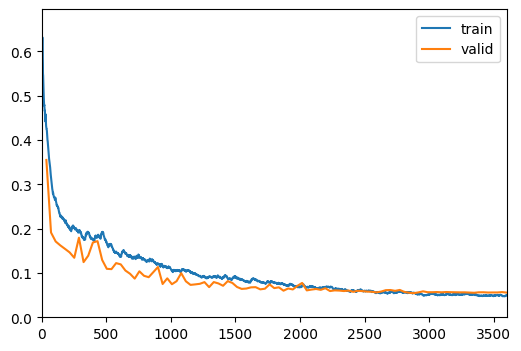

In [ ]:
transforms = 'original_transforms'
tile_type = '512 uneroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = False
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')

In [ ]:
print(timestamp())

2023-08-07_18:45


In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.821             0.809          0.834     0.901  0.696


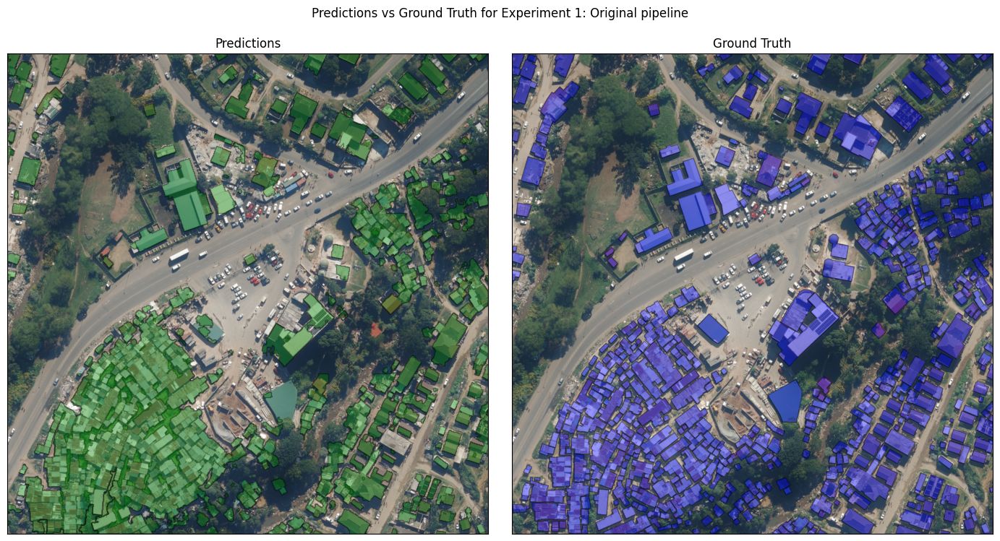

0.5078299776286354


In [ ]:
transforms = 'original_transforms'
tile_type = '512 uneroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = False
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
output_folder = f"{model_dir}/predictions"
experiment = "Experiment 1: Original pipeline"
predictions = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
raster = rasterio.open(file)
gt = gpd.read_file(test_labels)
plotting_func(raster, predictions, gt, experiment)

## Checking learning rate

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

slide = 0.0003311311302240938, valley = 6.30957365501672e-05


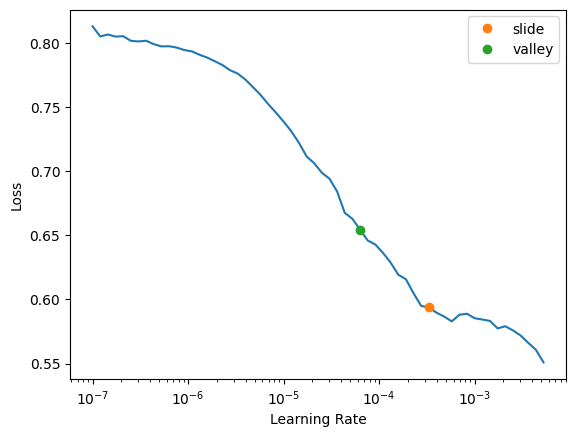

In [ ]:
transforms = 'original_transforms'
tile_type = '500 uneroded'
backbone = 'resnet18'
loss_function = None
erode = False

u_net_learning_rate(transforms, tile_type, backbone, loss_function, architecture='U-Net', split=.2)

slide = 0.0005754399462603033, valley = 1.4454397387453355e-05


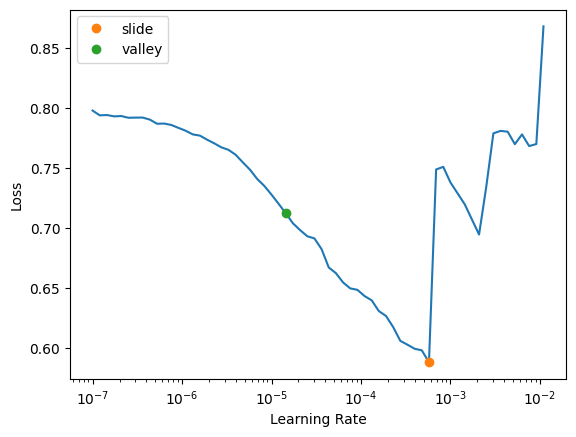

In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
loss_function = None
erode = False

u_net_learning_rate(transforms, tile_type, backbone, loss_function, architecture='U-Net', split=.2)

## Experiment 2: 500px tiles

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,0.395803,0.328100,0.686510,0.522661,00:55
1,0.317983,0.211722,0.799697,0.666246,00:43
2,0.254816,0.173102,0.833534,0.714580,00:42
3,0.244058,0.218176,0.819472,0.694158,00:40
4,0.220838,0.185557,0.834296,0.715701,00:42
5,0.193809,0.156907,0.854431,0.745858,00:41
6,0.181919,0.164642,0.853736,0.744799,00:40
7,0.177237,0.204867,0.741386,0.589050,00:44
8,0.174252,0.139089,0.864215,0.760897,00:39
9,0.170492,0.134955,0.864556,0.761426,00:42


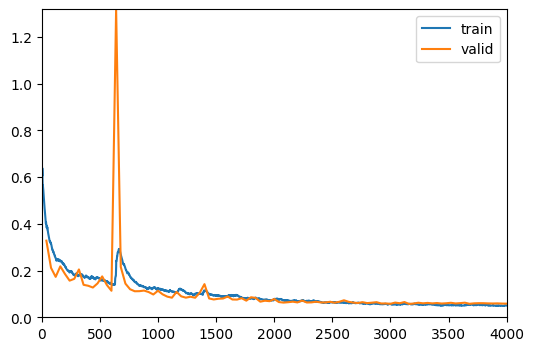

2023-08-08_11:05


In [ ]:
transforms = 'original_transforms'
tile_type = '500 uneroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = False
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')

print(timestamp())

In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.816             0.805          0.827     0.899  0.689


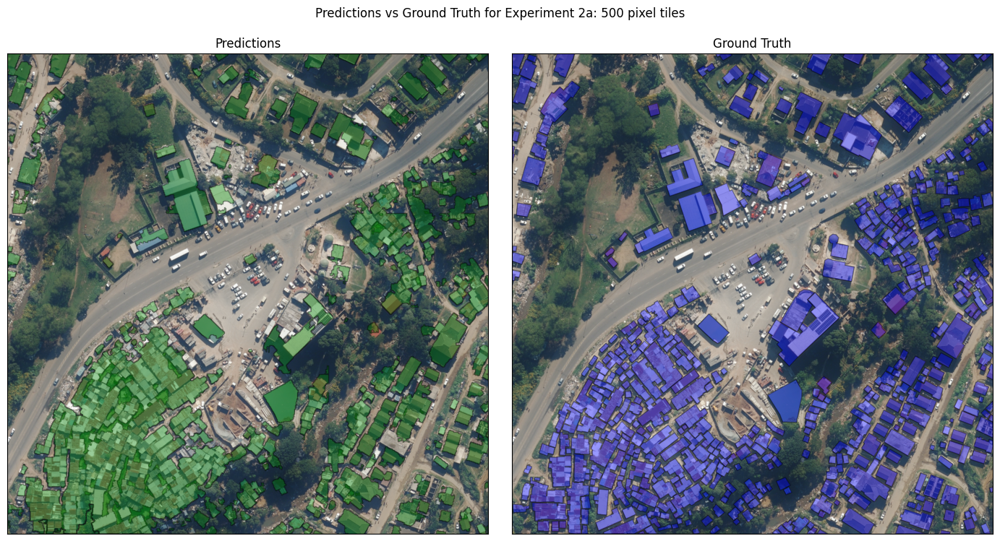

0.5167785234899329


In [ ]:
transforms = 'original_transforms'
tile_type = '500 uneroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = False
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
output_folder = f"{model_dir}/predictions"
experiment = "Experiment 2a: 500 pixel tiles"
predictions = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
raster = rasterio.open(file)
gt = gpd.read_file(test_labels)
plotting_func(raster, predictions, gt, experiment)

## Experiment 2a: 512 pix padded

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,0.346745,0.255526,0.647565,0.478814,03:32
1,0.282826,0.218843,0.783709,0.644343,00:42
2,0.242198,0.170988,0.815044,0.687827,00:39
3,0.208456,0.192620,0.744720,0.593270,00:40
4,0.201205,0.158318,0.824970,0.702084,00:41
5,0.190770,0.145692,0.853071,0.743788,00:40
6,0.175426,0.142532,0.859330,0.753355,00:41
7,0.178260,0.157150,0.807550,0.677219,00:38
8,0.179211,0.175534,0.827017,0.705055,00:42
9,0.168940,0.140566,0.866015,0.763692,00:38


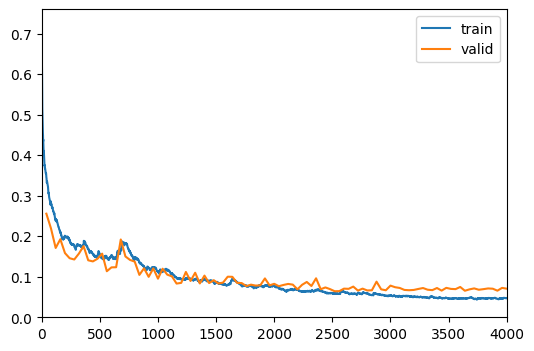

2023-08-08_15:11


In [ ]:
transforms = 'original_transforms'
tile_type = '512 uneroded padded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = False
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')

print(timestamp())

In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.818             0.812          0.824       0.9  0.692


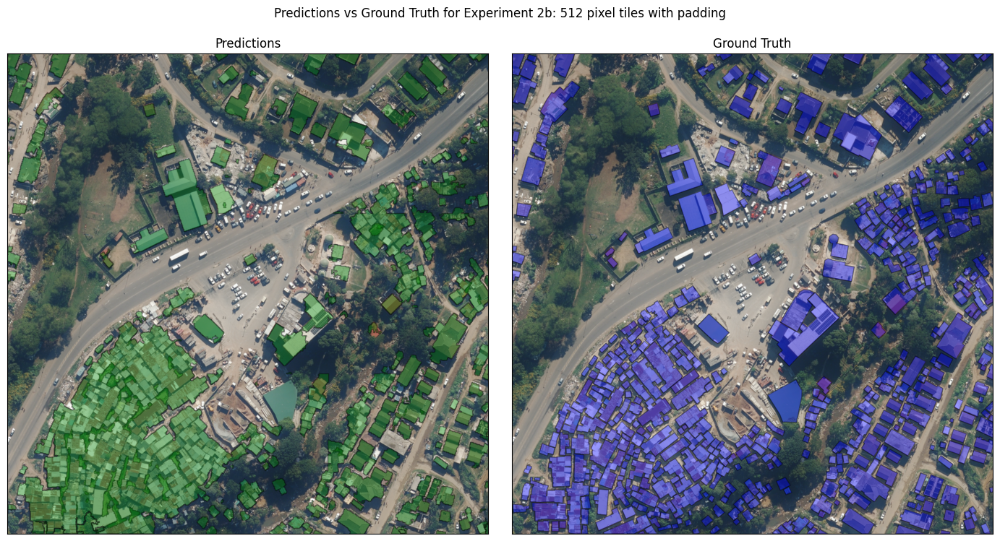

0.4697986577181208


In [ ]:
transforms = 'original_transforms'
tile_type = '512 uneroded padded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = False
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
output_folder = f"{model_dir}/predictions"
experiment = "Experiment 2b: 512 pixel tiles with padding"
predictions = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
raster = rasterio.open(file)
gt = gpd.read_file(test_labels)
plotting_func(raster, predictions, gt, experiment)

## Experiment 3: New transforms

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,0.465559,0.347052,0.355291,0.216020,01:04
1,0.364235,0.250836,0.595418,0.423911,00:40
2,0.308737,0.216702,0.791600,0.655081,00:42
3,0.265460,0.174079,0.829398,0.708523,00:41
4,0.245915,0.163058,0.838634,0.722110,00:37
5,0.248436,0.230058,0.604664,0.433346,00:39
6,0.246144,0.157274,0.818827,0.693232,00:38
7,0.233206,0.188015,0.839494,0.723386,00:38
8,0.230631,0.154887,0.822573,0.698620,00:39
9,0.229044,0.153328,0.859606,0.753780,00:38


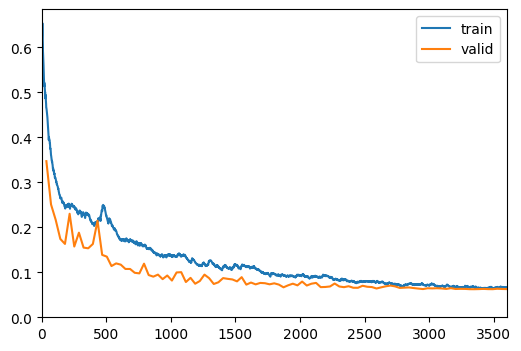

In [ ]:
transforms = 'new_transforms'
tile_type = '512 uneroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = False
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')
print(timestamp())

In [ ]:
print(timestamp())

2023-08-08_17:13


In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.916             0.934          0.899     0.955  0.845


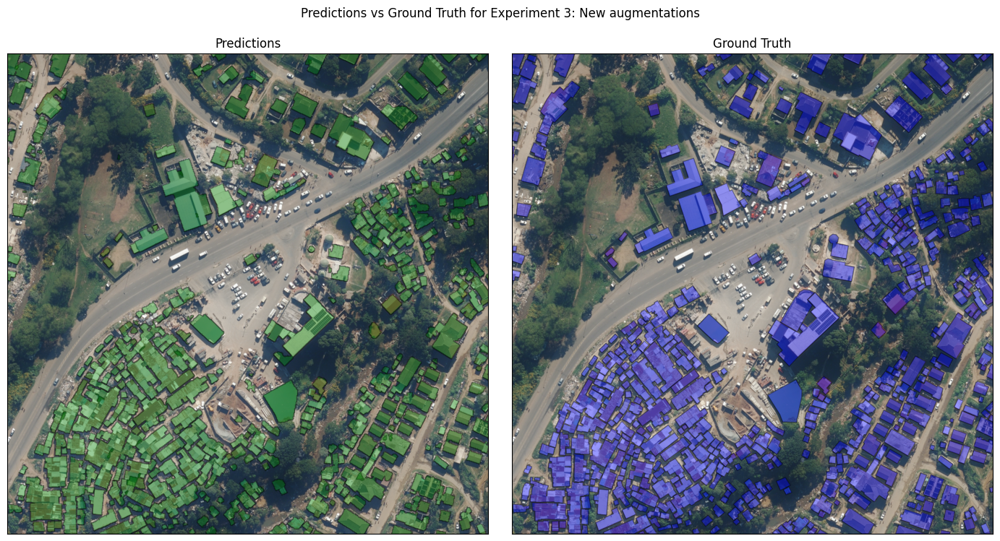

0.6510067114093959


In [ ]:
transforms = 'new_transforms'
tile_type = '512 uneroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = False
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
output_folder = f"{model_dir}/predictions"
experiment = "Experiment 3: New augmentations"
predictions = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
raster = rasterio.open(file)
gt = gpd.read_file(test_labels)
plotting_func(raster, predictions, gt, experiment)

## Experiment 4: Eroded tiles

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,0.432778,0.332077,0.411413,0.258981,02:57
1,0.348771,0.255818,0.509340,0.341688,00:42
2,0.293272,0.220784,0.783352,0.643861,00:36
3,0.251087,0.159203,0.816130,0.689375,00:39
4,0.237284,0.156278,0.840805,0.725335,00:37
5,0.227027,0.150180,0.844176,0.730367,00:38
6,0.215718,0.139768,0.844438,0.730759,00:38
7,0.210042,0.147023,0.854859,0.746509,00:39
8,0.222934,0.138276,0.857499,0.750545,00:38
9,0.218895,0.147221,0.834437,0.715909,00:37


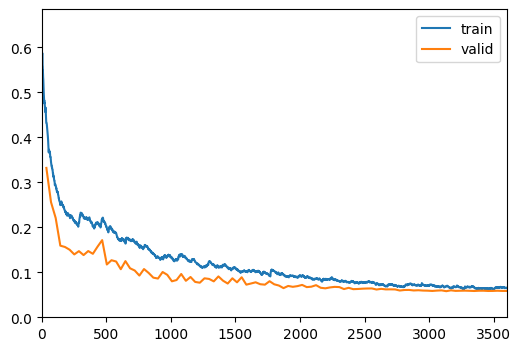

2023-08-08_19:16


In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')
print(timestamp())

In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.898             0.956          0.846     0.948  0.814


In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
loaded_model = load_learner(f'{model_dir}/U-Net_loss_None_2023-08-08_19:16_exported.pkl', cpu = True)
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.911             0.938          0.885     0.952  0.836


In [ ]:
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
return_metrics(groundtruth_mask, pred_mask)

   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.888             0.932          0.847     0.941  0.798


,dice_coef,precision_score_,recall_score_,accuracy,iou
0,0.888,0.932,0.847,0.941,0.798


In [ ]:
model_dir

'/content/drive/MyDrive/BEAM/training_imagery/models/experiment_results/U-Net/resnet18/lr_None/new_transforms/512 eroded'

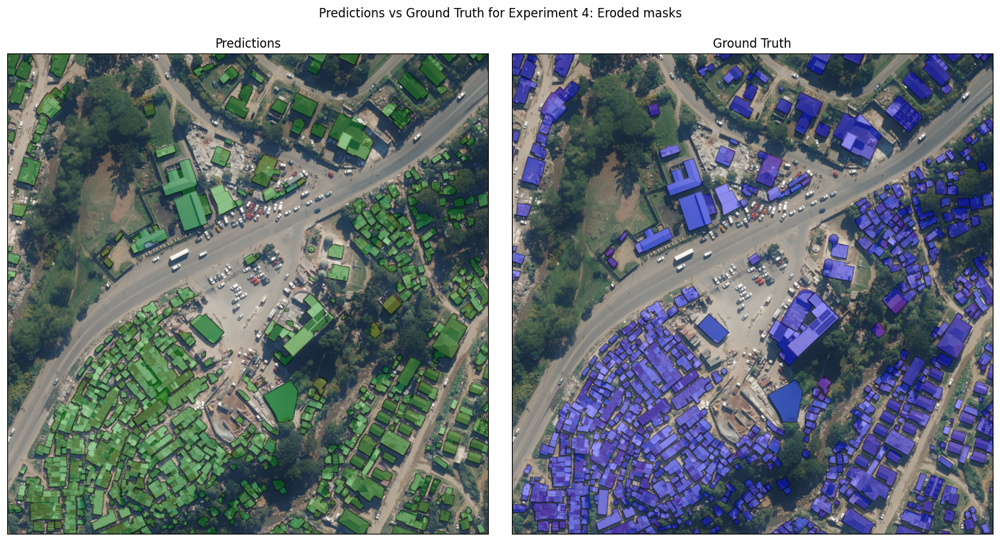

0.7248322147651006


In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
output_folder = f"{model_dir}/predictions"
experiment = "Experiment 4: Eroded masks"
predictions = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
raster = rasterio.open(file)
gt = gpd.read_file(test_labels)
plotting_func(raster, predictions, gt, experiment)

## Experiment 5: Custom Learning rate

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

slide = 0.0002290867705596611, valley = 3.0199516913853586e-05


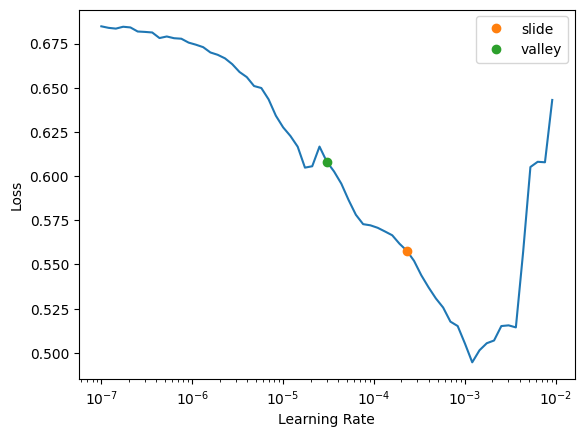

In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
loss_function = None
erode = True

u_net_learning_rate(transforms, tile_type, backbone, loss_function, architecture='U-Net', split=.2)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,0.437131,0.339187,0.424832,0.269706,01:31
1,0.363790,0.274382,0.499503,0.332892,00:40
2,0.312081,0.214912,0.773878,0.631159,00:36
3,0.281238,0.188511,0.787978,0.650134,00:39
4,0.276030,0.191466,0.746341,0.595330,00:37
5,0.252886,0.158336,0.821749,0.697432,00:38
6,0.242697,0.166782,0.833839,0.715029,00:38
7,0.225341,0.181282,0.828834,0.707699,00:39
8,0.213912,0.151220,0.813256,0.685283,00:41
9,0.215111,0.142595,0.846942,0.734518,00:37


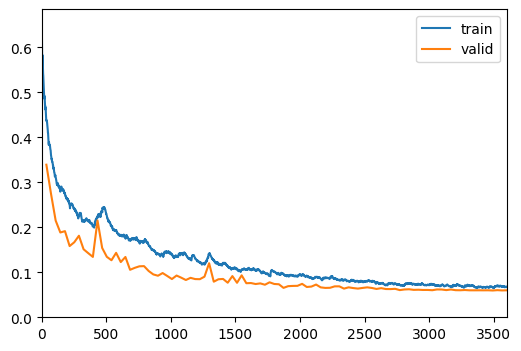

2023-08-09_11:15


In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = 0.0004
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')

print(timestamp())

In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy   iou
0      0.913              0.94          0.888     0.954  0.84


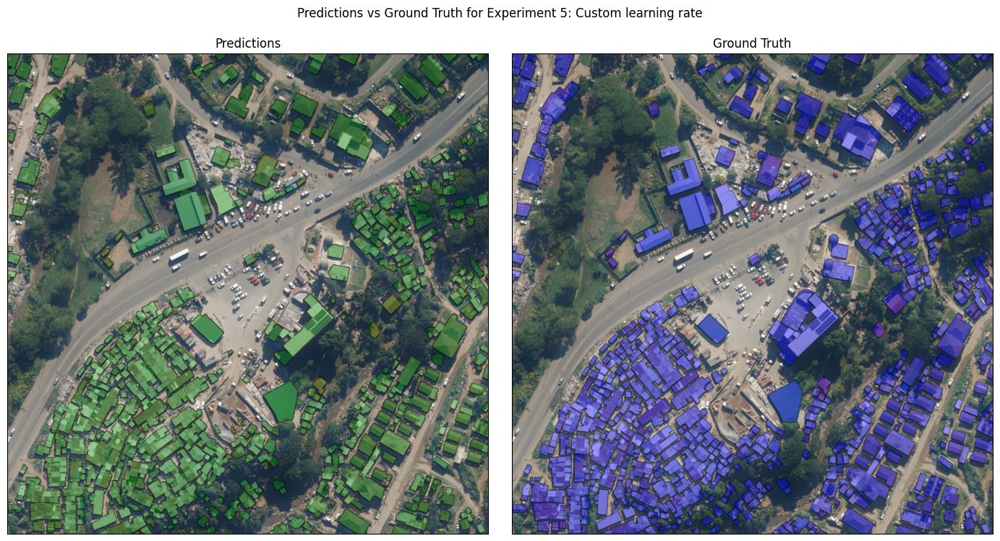

0.7069351230425056


In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = 0.0004
epochs = 100
architecture = 'U-Net'
loss_function = None
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
output_folder = f"{model_dir}/predictions"
experiment = "Experiment 5: Custom learning rate"
predictions = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
raster = rasterio.open(file)
gt = gpd.read_file(test_labels)
plotting_func(raster, predictions, gt, experiment)

## Experiment 6: Dice Focal Loss

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,6.573547,5.608758,0.563027,0.391814,02:53
1,6.224005,3.946971,0.759998,0.612901,00:40
2,5.487477,3.345018,0.804327,0.672699,00:35
3,4.883642,2.924253,0.829083,0.708063,00:38
4,4.624260,3.161068,0.806235,0.675371,00:39
5,4.276099,2.329697,0.840602,0.725033,00:36
6,4.213226,2.421929,0.835200,0.717033,00:39
7,3.972186,3.361335,0.828249,0.706847,00:36
8,3.953370,3.100104,0.805364,0.674150,00:39
9,4.000102,2.367465,0.856830,0.749522,00:39


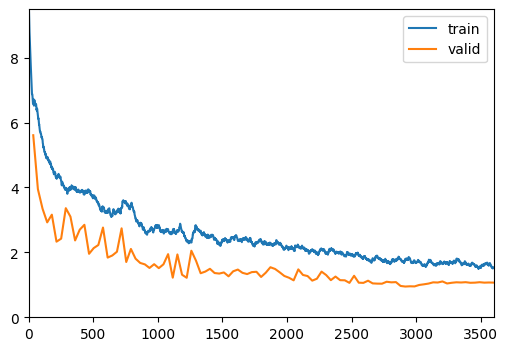

2023-08-09_12:57


In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 100
architecture = 'U-Net'
loss_function = 'Combined'
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')

print(timestamp())

In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.892             0.931          0.856     0.944  0.805


## 6a: Dice Focal New LR

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

slide = 0.00010964782268274575, valley = 7.585775892948732e-05


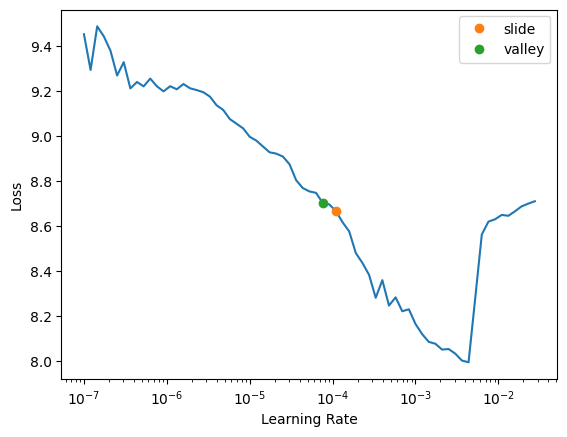

In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
loss_function = 'Combined'
erode = True

u_net_learning_rate(transforms, tile_type, backbone, loss_function, architecture='U-Net', split=.2)

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,7.932773,6.758508,0.433066,0.276378,00:55
1,6.793700,4.553047,0.725986,0.569841,00:38
2,5.926829,4.048022,0.763834,0.617906,00:37
3,5.360855,3.496429,0.801972,0.669410,00:39
4,5.049793,3.455837,0.807308,0.676879,00:39
5,4.779882,3.224643,0.814737,0.687389,00:36
6,4.628920,3.080626,0.828530,0.707257,00:36
7,4.556849,4.334091,0.744009,0.592368,00:39
8,4.371283,2.809159,0.842935,0.728512,00:36
9,4.380198,2.847004,0.827002,0.705032,00:39


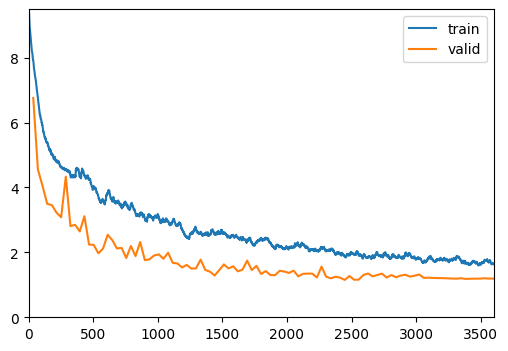

2023-08-09_15:03


In [ ]:
transforms = 'new_transforms'
tile_type = '512 eroded'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = 0.0002
epochs = 100
architecture = 'U-Net'
loss_function = 'Combined'
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')

print(timestamp())

In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.876             0.917          0.839     0.936  0.779


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,0.239244,0.190188,0.751236,0.601584,04:32
1,0.209751,0.159972,0.788938,0.651443,04:28
2,0.191350,0.156873,0.784932,0.645999,04:22
3,0.186142,0.142833,0.816849,0.690401,04:24
4,0.175734,0.134697,0.825213,0.702436,04:20
5,0.163426,0.131834,0.828382,0.707040,04:22
6,0.159729,0.128920,0.843241,0.728969,04:23
7,0.157689,0.122349,0.846619,0.734033,04:19
8,0.153137,0.118484,0.844245,0.730471,04:24
9,0.152827,0.113203,0.848081,0.736233,04:21


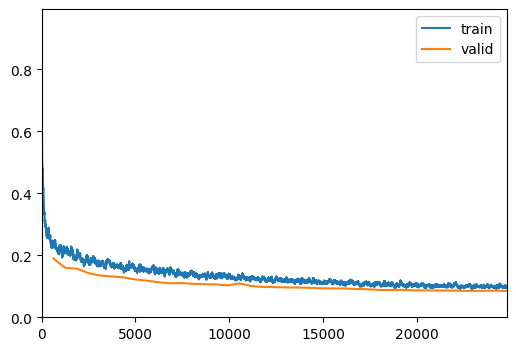

2023-08-16_15:11


In [ ]:
open_source = True
transforms = 'new_transforms'
tile_type = '256 eroded_open_source'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 40
architecture = 'U-Net'
loss_function = None
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')
print(timestamp())

In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

Metrics for U-Net:
   dice_coef  precision_score_  recall_score_  accuracy    iou
0      0.902             0.922          0.883     0.948  0.822


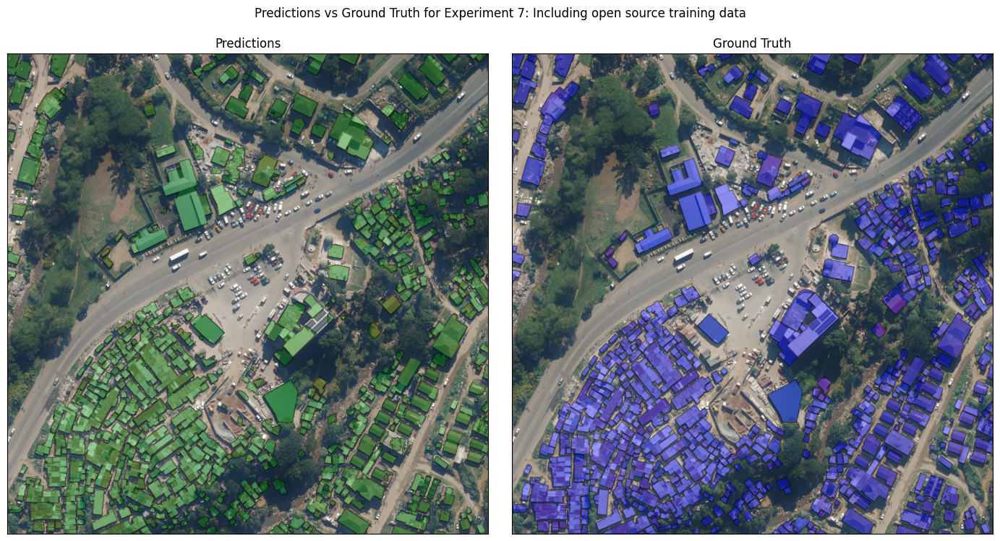

0.8948545861297539


In [ ]:
open_source = True
transforms = 'new_transforms'
tile_type = '256 eroded_open_source'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 40
architecture = 'U-Net'
loss_function = None
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
output_folder = f"{model_dir}/predictions"
experiment = "Experiment 7: Including open source training data"
predictions = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
raster = rasterio.open(file)
gt = gpd.read_file(test_labels)
plotting_func(raster, predictions, gt, experiment)

In [ ]:
gdf = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
gdf

<Axes: >

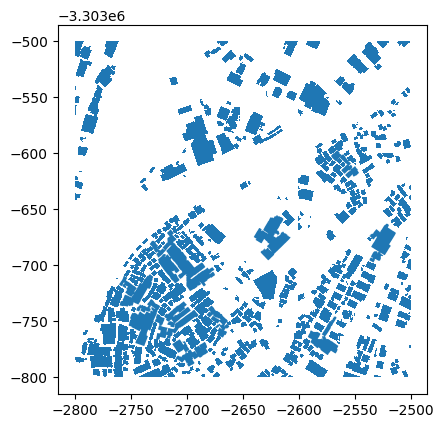

In [ ]:
gdf.plot()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,dice,jaccard_coeff,time
0,0.344266,0.257093,0.618874,0.448094,04:26
1,0.258410,0.206524,0.719334,0.561688,04:25
2,0.224514,0.265088,0.707153,0.546973,04:50
3,0.208076,0.170917,0.773201,0.630259,04:35
4,0.192731,0.162826,0.747332,0.596592,04:27
5,0.185705,0.151634,0.802767,0.670518,04:27
6,0.176025,0.138830,0.810077,0.680781,04:26
7,0.178276,0.138050,0.819515,0.694218,04:21
8,0.164882,0.138231,0.826343,0.704076,04:23
9,0.159329,0.137001,0.831504,0.711601,04:27


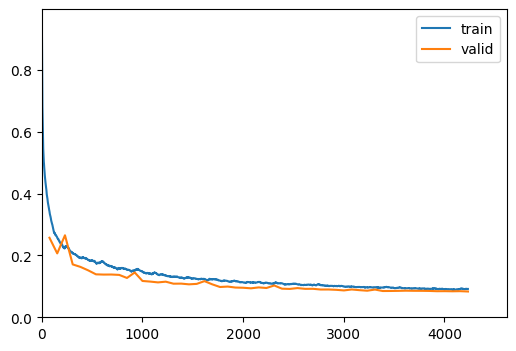

OSError: ignored

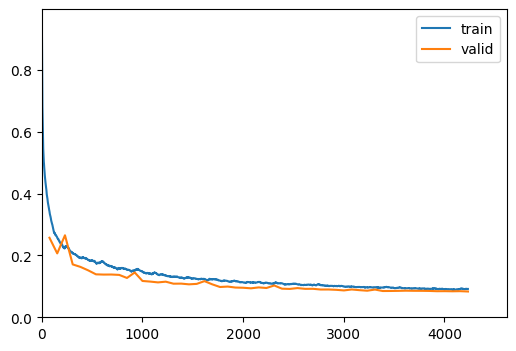

In [ ]:
open_source = True
transforms = 'new_transforms'
tile_type = '256 eroded_open_source_32b'
backbone = 'resnet18'
fit_type = 'one_cycle'
learning_rate = None
epochs = 60
architecture = 'U-Net'
loss_function = None
erode = True
model_dir = f'{path}/models/experiment_results/{architecture}/{backbone}/lr_{learning_rate}/{transforms}/{tile_type}'
create_missing_folder(model_dir)

learn, dls = u_net_model_training(transforms, tile_type, backbone, fit_type, learning_rate, epochs, loss_function, architecture='U-Net', split=.2)

learn.export(f'{model_dir}/{architecture}_loss_{loss_function}_{timestamp()}_exported.pkl')
print(timestamp())

In [ ]:
dls.bs

8

In [ ]:
loaded_model = learn
output_folder = f"{model_dir}/predictions"
create_missing_folder(output_folder)
create_inferences(file)
groundtruth_mask = generate_mask(file, test_labels)
pred_mask = generate_mask(file, f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
print(f"Metrics for {architecture}:")
metrics = return_metrics(groundtruth_mask, pred_mask)
metrics.to_csv(f"{model_dir}/metrics.csv")

In [ ]:
gdf = gpd.read_file(f"{output_folder}/Clipped_2022_BZ_64.tif_predicted.shp")
gdf

In [ ]:
gdf.plot()

In [ ]:
from google.colab import runtime
runtime.unassign()